# Importações e Bibliotecas

In [73]:
import random # Operações de aleatoriedade
import sys # Operações do sistema (print, etc)
import statistics # Operações de estatística

In [74]:
from market import Market, Produto # Importa a classe Market e a classe Produto

In [75]:
# Importações para construção gráfica do melhor indivíduo e do gráfico de evolução
from PIL import Image
from IPython.display import display
import plotly.graph_objects as go

# Valores Estáticos

In [76]:
CART: dict = {
    'Altura': 65,
    'Largura': 50,
    'Comprimento': 80,
    'PesoMaximo': 460*1000
}
CART['Capacidade'] = CART['Altura'] * CART['Largura'] * CART['Comprimento']

CART

{'Altura': 65,
 'Largura': 50,
 'Comprimento': 80,
 'PesoMaximo': 460000,
 'Capacidade': 260000}

In [77]:
MAX_MONEY: float = 1750.0
MAX_ITEMS: int = 100
MAX_CARTS: int = 200
MAX_GENERATIONS: int = 1500
BESTS: int = 5

In [78]:
MED_PRICE: float = MAX_MONEY/MAX_ITEMS
f"Preço Médio por Produto: R${MED_PRICE:.2f}"

'Preço Médio por Produto: R$17.50'

# Funções

In [79]:
m: Market = Market(r"..\data\produtos.csv")
print(m)

Market Info
443 products loaded.


In [80]:
def mosaic(cart: list[Produto], row_quantity: int = 5, image_size: tuple[int, int] = (300, 300)) -> None:
    """Cria um mosaico com as imagens dos produtos do carrinho"""
    
    # Lista o objeto das imagens
    images: list[Image] = [product.show(popup=False).resize(image_size) for product in cart]
    
    # Calcula o tamanho do mosaico
    mosaic_size: tuple[int, int] = (image_size[0]*row_quantity, image_size[1]*((len(images)//row_quantity)+1))
    
    # Cria a imagem do mosaico
    mosaic: Image = Image.new('RGB', mosaic_size)
    
    # Coloca as imagens no mosaico
    for i, image in enumerate(images):
        mosaic.paste(image, (image_size[0]*(i%row_quantity), image_size[1]*(i//row_quantity)))
    
    # Exibe o mosaico
    display(mosaic) 

In [81]:
def plot_generations(data: dict[int, dict[str, float]]) -> None:
    """Plota um gráfico com os valores de cada geração"""
    
    # Extrai as iterações e os valores
    iterations: list = list(data.keys())
    max_values: list = [data[i]['max'] for i in iterations]
    min_values: list = [data[i]['min'] for i in iterations]
    avg_values: list = [data[i]['med'] for i in iterations]

    # Cria o objeto gráfico
    fig = go.Figure()

    # Adiciona as linhas para cada variável
    fig.add_trace(go.Scatter(x=iterations, y=max_values, mode='lines+markers', name='Max', line=dict(color="#a90000")))
    fig.add_trace(go.Scatter(x=iterations, y=min_values, mode='lines+markers', name='Min', line=dict(color="#007d1d")))
    fig.add_trace(go.Scatter(x=iterations, y=avg_values, mode='lines+markers', name='Medio', line=dict(color="#356fa8")))

    # Adiciona título e rótulos
    fig.update_layout(
                    title='Gráfico de Gerações',
                    xaxis_title='Iteração',
                    yaxis_title='Valores',
                    yaxis_type='log',  #! Define o eixo y como logarítmico
                    template='plotly'
                )

    # Exibe o gráfico
    fig.show()

In [82]:
def calculate_regression(data: dict, last: int = globals()['MAX_GENERATIONS']//5) -> float:
    """ Calcula a regressão linear dos valores de uma lista de gerações das últimas N gerações """
    
    # Se a quantidade de dados for menor que o mínimo, retorna infinito
    if len(data) < last:
        return float("inf")
    
    else:
        values: list = list(data.values())[-last:]
        return statistics.stdev([value.get('min') for value in values])

In [83]:
def instanciate(cart: list[int]) -> list[Produto]:
    """Instancia uma lista de produtos a partir de uma lista de IDs"""
    
    return [m.get(i) for i in cart]

In [84]:
def info(cart: list[int]) -> str:
    """ Retorna uma string com as informações do indivíduo/carrinho """
    nota: float = avaliar(cart)
    cart: list[Produto] = instanciate(cart)
    return f"[INDIVÍDUO]\n\
Nota: {nota}\n\
Tamanho: {len(cart)}\n\n\
[INFORMAÇÕES DO CARRINHO]\n\
Preço Total: R${sum([product.price for product in cart]):.2f}\n\
Peso Total: {sum([product.weight for product in cart])/1000:.2f}g\n\
Volume Total: {sum([product.volume for product in cart]):.2f}cm³\n\
Preço médio: R${sum([product.price for product in cart])/len(cart)}\n\n\
[PRODUTOS]\n\
Menor preço: R${min([product.price for product in cart])}\n\
Maior preço: R${max([product.price for product in cart])}\n\
Menor peso: {min([product.weight for product in cart])}g\n\
Maior peso: {max([product.weight for product in cart])}g\n\
Menor volume: {min([product.volume for product in cart])}cm³\n\
Maior volume: {max([product.volume for product in cart])}cm³\n\n\
[CATEGORIAS]:\n{"\n".join([f"- {category}: {[product.category for product in cart].count(category)}" for category in set([product.category for product in cart])])}\n\n\
[LISTAGEM]\n{"\n".join([f"{product.name} \t R${product.price:.2f} \t {product.weight:.2f}g \t {product.volume:.2f}cm³" for product in cart])}\n\
"

# Genético

### Geração de Indivíduos

In [85]:
def gerar_carrinho(tamanho: int = globals()['MAX_ITEMS']) -> list[int]:
    compra = []

    while len(compra) < tamanho:
        item: int = m.random()
        compra.append(item)
        
    return compra

In [86]:
c: list[int] = gerar_carrinho()
c

[1127409,
 440145,
 169774,
 55835,
 452630,
 409356,
 51538,
 1591027,
 344570,
 409358,
 91101,
 339051,
 293935,
 18855,
 102081,
 13204,
 309625,
 334112,
 90515,
 449568,
 324113,
 409355,
 145948,
 82810,
 584620,
 427861,
 218078,
 395827,
 1433062,
 318932,
 466678,
 12263,
 339013,
 1609288,
 133870,
 419634,
 30116,
 131201,
 4700,
 339013,
 595320,
 75455,
 95706,
 13918,
 92002,
 478712,
 400352,
 84242,
 112743,
 469043,
 113253,
 421704,
 34660,
 330383,
 108149,
 788816,
 273343,
 1591034,
 584617,
 455115,
 1615262,
 97185,
 174945,
 289978,
 335989,
 530631,
 270512,
 804250,
 788816,
 505570,
 37886,
 273342,
 9176,
 1433064,
 174284,
 190855,
 395827,
 131661,
 697134,
 463535,
 4700,
 1566833,
 13627,
 97608,
 431979,
 164065,
 30116,
 1619139,
 142418,
 339051,
 342349,
 479199,
 3893,
 336142,
 190855,
 1591035,
 284066,
 568622,
 1111950,
 95963]

### Geração de População Inicial

In [87]:
def gerar_populacao(tamanho: int = globals()['MAX_CARTS']) -> list[list[int]]:
    return [gerar_carrinho() for _ in range(tamanho)]

In [88]:
p: list[list[int]] = gerar_populacao()
p

[[1433060,
  55835,
  173742,
  409283,
  318932,
  131345,
  450942,
  103465,
  1477081,
  794143,
  174945,
  6971,
  411019,
  400352,
  1613314,
  287859,
  9461,
  1055834,
  1111943,
  449568,
  1376300,
  1613589,
  309902,
  155197,
  12263,
  1619001,
  1433060,
  72624,
  634933,
  459782,
  365762,
  198331,
  1375784,
  309902,
  1387081,
  1376300,
  427861,
  140374,
  334191,
  165494,
  239675,
  1615398,
  459333,
  12628,
  1441479,
  478808,
  1616498,
  10480,
  1628298,
  321141,
  271505,
  5639,
  120523,
  434779,
  1613589,
  40815,
  460529,
  239675,
  1466989,
  125781,
  409359,
  176191,
  145948,
  792756,
  125224,
  104503,
  323858,
  446660,
  168623,
  169950,
  318932,
  287859,
  216736,
  584617,
  18855,
  1441479,
  224134,
  113253,
  309625,
  350972,
  479199,
  318932,
  37565,
  512761,
  236619,
  58351,
  335989,
  1619001,
  78656,
  435500,
  190855,
  463526,
  419634,
  400352,
  434779,
  1614042,
  12263,
  440140,
  339050,
  2878

### Avaliação

In [89]:
def avaliar(individuo: list[int]) -> float:
    valor_total: float = 0.0
    peso_total: float = 0.0
    volume_total: float = 0.0
    repeticoes: int = 0
    categorias: list = []
    
    pesos = {
        'essencial': 1.65,
        'alimentos': 1.2,
        'açougue': 1.2,
        'beleza-e-perfumaria': 0.5,
        'bebidas': 0.7, 
        'bebidas-alcoolicas-': 0.3,
        'limpeza': 0.5,
        'cuidados-pessoais': 0.65 
    }
    
    for id in individuo:
        produto = m.get(id)
        volume_total+=produto.volume
        peso_total+=produto.weight
        valor_total+=produto.price
        categorias.append(produto.category)
        repeticoes+=individuo.count(id)
        
    nota = valor_total**2
    
    # Ônus
    nota*= max(1, volume_total - globals()['CART']['Capacidade'])
    nota*= max(1, peso_total - globals()['CART']['PesoMaximo'])
    nota*= max(1, valor_total - globals()['MAX_MONEY'])
    nota*= max(1, repeticoes - globals()['MAX_ITEMS'])

    # Bônus
    nota/= len(set(categorias))
    nota/= sum([pesos[c]**categorias.count(c) for c in set(categorias)])
    

    return nota**2 


In [90]:
n: float = avaliar(c)
n

1.2079126743810227e+17

In [91]:
def mapear_notas(populacao: list[list[int]], order: str = 'asc') -> dict[float, list[int]]:
    notas: dict = {avaliar(individuo): individuo for individuo in populacao}
    
    if order == 'asc':
        return dict(sorted(notas.items()))
    
    else:
        return dict(sorted(notas.items(), reverse=True))

In [92]:
nt: dict[float, list[int]] = mapear_notas(p)
nt

{109725632457.80873: [182417,
  1376370,
  1538481,
  335996,
  1600697,
  439797,
  339053,
  1433060,
  284478,
  411008,
  270512,
  1466989,
  137290,
  159064,
  1616281,
  1441479,
  155197,
  218078,
  59785,
  365395,
  271505,
  467415,
  343885,
  116609,
  794143,
  344570,
  164065,
  409753,
  398436,
  715822,
  71969,
  174945,
  97608,
  1613589,
  173710,
  336102,
  74215,
  455115,
  585414,
  1466989,
  306589,
  427861,
  402459,
  174511,
  460529,
  99466,
  9461,
  318932,
  141168,
  146522,
  31117,
  512761,
  180330,
  343565,
  384522,
  53077,
  168387,
  392464,
  467613,
  711969,
  232466,
  24186,
  455623,
  452630,
  9461,
  174284,
  472658,
  133870,
  427413,
  1566833,
  70251,
  804255,
  499770,
  568622,
  9176,
  1591040,
  78635,
  1376508,
  3893,
  339053,
  12263,
  109875,
  334112,
  271505,
  479199,
  106572,
  467658,
  427067,
  1538480,
  365990,
  1107472,
  30116,
  168623,
  343634,
  792756,
  1376508,
  421704,
  1628298,
  70

### Seleção

In [93]:
def torneio(populacao: list[list[int]]) -> list[list[int]]:
    vencedores: list[list[int] | None] = []
    
    while len(vencedores) < 2:
        competidores: list[list[int]] = random.sample(populacao, 2)
        
        if all(competidor not in vencedores for competidor in competidores):    
            if avaliar(competidores[0]) < avaliar(competidores[1]):
                vencedor: list[int] = competidores[0]
            
            elif avaliar(competidores[0]) > avaliar(competidores[1]):
                vencedor: list[int] = competidores[1]
                
            else:
                vencedor: list[int] = random.choice([competidores[0], competidores[1]])
                
            vencedores.append(vencedor)
    
    return vencedores

In [94]:
v1: list[list[int]] = torneio(p)
v1

[[56627,
  1615262,
  13204,
  1246070,
  153540,
  1559869,
  175471,
  1057832,
  82880,
  1376291,
  568623,
  18855,
  408426,
  328034,
  1107472,
  292195,
  1613587,
  173710,
  104503,
  324113,
  440145,
  335989,
  1461013,
  1111953,
  91101,
  102476,
  339035,
  467420,
  125781,
  1591027,
  178400,
  585414,
  133870,
  113943,
  440145,
  1616282,
  465051,
  1614235,
  56627,
  30116,
  74215,
  133870,
  479197,
  164887,
  796083,
  1614082,
  22306,
  792756,
  1614042,
  339053,
  478712,
  330383,
  354327,
  467420,
  13918,
  1614790,
  1107472,
  142418,
  113253,
  287859,
  290020,
  176191,
  159064,
  528838,
  455623,
  1433061,
  153708,
  220254,
  153540,
  334119,
  1618553,
  70251,
  460528,
  159064,
  1376300,
  794143,
  1591035,
  1613587,
  232466,
  339013,
  101493,
  1944,
  1246070,
  409355,
  344310,
  1606865,
  463526,
  5639,
  1433068,
  467415,
  1376290,
  174945,
  421704,
  335996,
  180330,
  168387,
  460528,
  1944,
  1602897,
 

In [95]:
def roleta_viciada(populacao: list[list[int]]) -> list[list[int]]:
    fitness_list: list[float] = [1 / avaliar(individuo) for individuo in populacao]
    total_fitness: float = sum(fitness_list)
    probabilities: list[float] = [fitness / total_fitness for fitness in fitness_list]
    
    vencedores: list[list[int]] = random.choices(populacao, weights=probabilities, k=2)
    
    return vencedores

In [96]:
v2: list[list[int]] = roleta_viciada(p)
v2

[[344570,
  431979,
  1615398,
  92002,
  411019,
  125224,
  804255,
  270512,
  463526,
  461592,
  411019,
  334191,
  318932,
  343565,
  365762,
  3893,
  6971,
  306589,
  287859,
  792756,
  458691,
  1606861,
  1618553,
  153540,
  796083,
  245703,
  1944,
  499770,
  9176,
  199100,
  137858,
  153540,
  462300,
  82810,
  1559869,
  1609288,
  153708,
  1614082,
  1615391,
  108149,
  1433064,
  131201,
  13204,
  463526,
  11672,
  102081,
  287859,
  463535,
  1602362,
  788816,
  788816,
  42166,
  407910,
  138477,
  176149,
  113943,
  460529,
  1387081,
  290020,
  74949,
  328762,
  321143,
  478808,
  145358,
  328356,
  174284,
  56113,
  697133,
  343565,
  1376290,
  30116,
  22306,
  19468,
  107136,
  78656,
  435500,
  287859,
  334177,
  137858,
  324326,
  125107,
  92002,
  1375784,
  5639,
  137290,
  174284,
  1125858,
  1433064,
  478712,
  796083,
  427413,
  334191,
  1591033,
  15428,
  239675,
  336101,
  434779,
  323696,
  1616282,
  615918],
 [3445

In [97]:
def eugenia(populacao: list[list[int]], order: str = 'asc') -> list[list[int]]:
    notas: dict[float, list[int]] = mapear_notas(populacao, order)
    melhores: list[list[int]] = list(notas.values())[:globals()['BESTS']]
    
    return melhores

In [98]:
e: list[list[int]] = eugenia(p)
e

[[182417,
  1376370,
  1538481,
  335996,
  1600697,
  439797,
  339053,
  1433060,
  284478,
  411008,
  270512,
  1466989,
  137290,
  159064,
  1616281,
  1441479,
  155197,
  218078,
  59785,
  365395,
  271505,
  467415,
  343885,
  116609,
  794143,
  344570,
  164065,
  409753,
  398436,
  715822,
  71969,
  174945,
  97608,
  1613589,
  173710,
  336102,
  74215,
  455115,
  585414,
  1466989,
  306589,
  427861,
  402459,
  174511,
  460529,
  99466,
  9461,
  318932,
  141168,
  146522,
  31117,
  512761,
  180330,
  343565,
  384522,
  53077,
  168387,
  392464,
  467613,
  711969,
  232466,
  24186,
  455623,
  452630,
  9461,
  174284,
  472658,
  133870,
  427413,
  1566833,
  70251,
  804255,
  499770,
  568622,
  9176,
  1591040,
  78635,
  1376508,
  3893,
  339053,
  12263,
  109875,
  334112,
  271505,
  479199,
  106572,
  467658,
  427067,
  1538480,
  365990,
  1107472,
  30116,
  168623,
  343634,
  792756,
  1376508,
  421704,
  1628298,
  70008,
  102081],
 [33

### Crossover e Mutação

In [99]:
def cruzamento(pais: list[list[int]], chance: float = 0.05, num_pontos_corte: int = 3) -> list[list[int]]:
    pai_1: list[int] = pais[0]
    pai_2: list[int] = pais[1]

    probabilidade: float = round(random.uniform(0, 1), 2)
    if probabilidade < chance:
        pontos_corte: list[int] = sorted(random.sample(range(1, len(pai_1)), num_pontos_corte))

        filho_1: list[int | None] = []
        filho_2: list[int | None] = []

        pos_inicio: int = 0
        for i in range(num_pontos_corte):
            pos_fim = pontos_corte[i]
            filho_1 += pai_1[pos_inicio:pos_fim] if i % 2 == 0 else pai_2[pos_inicio:pos_fim]
            filho_2 += pai_2[pos_inicio:pos_fim] if i % 2 == 0 else pai_1[pos_inicio:pos_fim]
            pos_inicio = pos_fim

        # Adicionando a parte restante do genoma após o último ponto de corte
        filho_1 += pai_1[pos_inicio:]
        filho_2 += pai_2[pos_inicio:]

        return [filho_1, filho_2]

    else:
        return [pai_1, pai_2]

In [100]:
f: list[list[int]] = cruzamento(v1)
f

[[56627,
  1615262,
  13204,
  1246070,
  153540,
  1559869,
  175471,
  1057832,
  82880,
  1376291,
  568623,
  18855,
  408426,
  328034,
  1107472,
  292195,
  1613587,
  173710,
  104503,
  324113,
  440145,
  335989,
  1461013,
  1111953,
  91101,
  102476,
  339035,
  467420,
  125781,
  1591027,
  178400,
  585414,
  133870,
  113943,
  440145,
  1616282,
  465051,
  1614235,
  56627,
  30116,
  74215,
  133870,
  479197,
  164887,
  796083,
  1614082,
  22306,
  792756,
  1614042,
  339053,
  478712,
  330383,
  354327,
  467420,
  13918,
  1614790,
  1107472,
  142418,
  113253,
  287859,
  290020,
  176191,
  159064,
  528838,
  455623,
  1433061,
  153708,
  220254,
  153540,
  334119,
  1618553,
  70251,
  460528,
  159064,
  1376300,
  794143,
  1591035,
  1613587,
  232466,
  339013,
  101493,
  1944,
  1246070,
  409355,
  344310,
  1606865,
  463526,
  5639,
  1433068,
  467415,
  1376290,
  174945,
  421704,
  335996,
  180330,
  168387,
  460528,
  1944,
  1602897,
 

In [101]:
def mutar(populacao: list[list[int]], chance = 0.05) -> list[list[int]]: 
    mutados: list[list[int]] = []

    for individuo in populacao:
        for pos, alelo in enumerate(individuo):
            mutacao: float = round(random.uniform(0, 1), 3)

            if mutacao < chance:
                novo_gene: str = m.random(ignore_case=[alelo,]) 
                individuo: str = individuo[:pos] + [novo_gene] + individuo[pos+1:]

        mutados.append(individuo)
    
    return mutados

In [102]:
mt: list[list[Produto]] = mutar(f)
mt

[[56627,
  1615262,
  13204,
  1246070,
  153540,
  1559869,
  175471,
  1057832,
  51538,
  1376291,
  568623,
  18855,
  408426,
  328034,
  1107472,
  292195,
  1613587,
  165471,
  104503,
  324113,
  125224,
  335989,
  1461013,
  1111953,
  91101,
  102476,
  339035,
  467420,
  125781,
  1591027,
  178400,
  585414,
  133870,
  113943,
  440145,
  1616282,
  465051,
  1614235,
  56627,
  30116,
  74215,
  133870,
  479197,
  164887,
  796083,
  1614082,
  22306,
  102081,
  409356,
  339053,
  478712,
  330383,
  354327,
  467420,
  13918,
  1614790,
  1107472,
  142418,
  113253,
  287859,
  290020,
  176191,
  327625,
  528838,
  455623,
  1433061,
  153708,
  220254,
  153540,
  334119,
  1618553,
  70251,
  460528,
  159064,
  1623448,
  794143,
  1591035,
  1613587,
  232466,
  339013,
  101493,
  1944,
  1246070,
  409355,
  344310,
  1606865,
  463526,
  5639,
  1433068,
  467415,
  1376290,
  174945,
  421704,
  335996,
  180330,
  165471,
  460528,
  1944,
  125781,
  5

# Execução Principal

In [103]:
relatorio: dict[dict[str: float]] = {}

In [104]:
if __name__ == '__main__':
    i: int = 1
    populacao_atual: list[list[int]] = gerar_populacao()
    notas: list[float | None] = list(mapear_notas(populacao_atual).keys())
    
    while (i <= MAX_GENERATIONS) and (calculate_regression(relatorio) >= 1) and (0 not in notas):
        geracao: list[list[int]] = []
        
        while len(geracao) < (MAX_CARTS - BESTS):
            pais: list[list[int]] = torneio(populacao_atual)
            # pais: list[list[int]] = roleta_viciada(populacao_atual)
            
            filhos: list[list[int]] = mutar(cruzamento(pais))
            geracao.extend(filhos)
            
        geracao.extend(eugenia(populacao_atual))
        
        populacao_atual: list[list[int]] = geracao.copy()
        notas: list[float] = list(mapear_notas(populacao_atual).keys())
        relatorio[i] = {'max': max(notas), 'min': min(notas), 'med': statistics.median(notas)}
        sys.stdout.write(f'\rGeração: {i}\n')
        i+=1

Geração: 1
Geração: 2
Geração: 3
Geração: 4
Geração: 5
Geração: 6
Geração: 7
Geração: 8
Geração: 9
Geração: 10
Geração: 11
Geração: 12
Geração: 13
Geração: 14
Geração: 15
Geração: 16
Geração: 17
Geração: 18
Geração: 19
Geração: 20
Geração: 21
Geração: 22
Geração: 23
Geração: 24
Geração: 25
Geração: 26
Geração: 27
Geração: 28
Geração: 29
Geração: 30
Geração: 31
Geração: 32
Geração: 33
Geração: 34
Geração: 35
Geração: 36
Geração: 37
Geração: 38
Geração: 39
Geração: 40
Geração: 41
Geração: 42
Geração: 43
Geração: 44
Geração: 45
Geração: 46
Geração: 47
Geração: 48
Geração: 49
Geração: 50
Geração: 51
Geração: 52
Geração: 53
Geração: 54
Geração: 55
Geração: 56
Geração: 57
Geração: 58
Geração: 59
Geração: 60
Geração: 61
Geração: 62
Geração: 63
Geração: 64
Geração: 65
Geração: 66
Geração: 67
Geração: 68
Geração: 69
Geração: 70
Geração: 71
Geração: 72
Geração: 73
Geração: 74
Geração: 75
Geração: 76
Geração: 77
Geração: 78
Geração: 79
Geração: 80
Geração: 81
Geração: 82
Geração: 83
Geração: 84
G

KeyboardInterrupt: 

In [ ]:
for gen, data in relatorio.items():
    print(f'Geração: {gen} - {data}')

Geração: 1 - {'max': 1.8184003510373282e+19, 'min': 196285802480.31122, 'med': 7.929342585515272e+16}
Geração: 2 - {'max': 1.3886398542735043e+18, 'min': 134348552795.8975, 'med': 1.8935202408325944e+16}
Geração: 3 - {'max': 1.3115726686294487e+18, 'min': 134348552795.8975, 'med': 3580252267460983.0}
Geração: 4 - {'max': 1.342264903848027e+24, 'min': 85349397457.68709, 'med': 121756046117988.23}
Geração: 5 - {'max': 3.74758575204109e+20, 'min': 74589193169.12134, 'med': 1665422498188.508}
Geração: 6 - {'max': 8.285994495120532e+17, 'min': 30118951164.463547, 'med': 797687144956.7734}
Geração: 7 - {'max': 5.628303608463102e+16, 'min': 16152636232.851048, 'med': 468803667388.77356}
Geração: 8 - {'max': 6914009757359648.0, 'min': 11635286376.986814, 'med': 305577047653.6722}
Geração: 9 - {'max': 3.039248604403308e+17, 'min': 11635286376.986814, 'med': 289863471263.37946}
Geração: 10 - {'max': 4.227692410644184e+16, 'min': 3683269029.01246, 'med': 212474790679.0857}
Geração: 11 - {'max': 8

In [ ]:
plot_generations(relatorio)

In [ ]:
best_individual: list[int] = eugenia(populacao_atual)[0]
best_cart: list[Produto] = instanciate(best_individual)

print(f"Última Geração: {i}\n\n", info(best_individual))

Última Geração: 6500

 [INDIVÍDUO]
Nota: 7486.96318384917
Tamanho: 100

[INFORMAÇÕES DO CARRINHO]
Preço Total: R$641.57
Peso Total: 42.55g
Volume Total: 151124.68cm³
Preço médio: R$6.4157

[PRODUTOS]
Menor preço: R$1.49
Maior preço: R$28.9
Menor peso: 1.0g
Maior peso: 1770.0g
Menor volume: 1.0cm³
Maior volume: 18609.625cm³

[CATEGORIAS]:
- açougue: 1
- limpeza: 8
- essencial: 2
- bebidas-alcoolicas-: 13
- bebidas: 28
- cuidados-pessoais: 12
- beleza-e-perfumaria: 1
- alimentos: 35

[LISTAGEM]
Manteiga Francesa com Sal PRÉSIDENT Tablete 200g 	 R$16.49 	 202.10g 	 214.27cm³
Refresco em pó Tang Laranja Docinha 18g 	 R$1.49 	 20.00g 	 72.90cm³
Refrigerante Coca-Cola Garrafa 200ml 	 R$1.99 	 226.00g 	 397.50cm³
Maçã Gala Granel 500g (Aprox. 2 a 3 Unid) 	 R$9.45 	 1000.00g 	 1.00cm³
Cerveja Lager Heineken Sleek Lata 350ml 	 R$5.79 	 367.00g 	 514.45cm³
Refresco em pó Tang Uva 18g 	 R$1.49 	 20.00g 	 72.90cm³
Cerveja Heineken Lata 269ml 	 R$3.99 	 283.00g 	 402.62cm³
Suco Del Valle Kapo Sabor

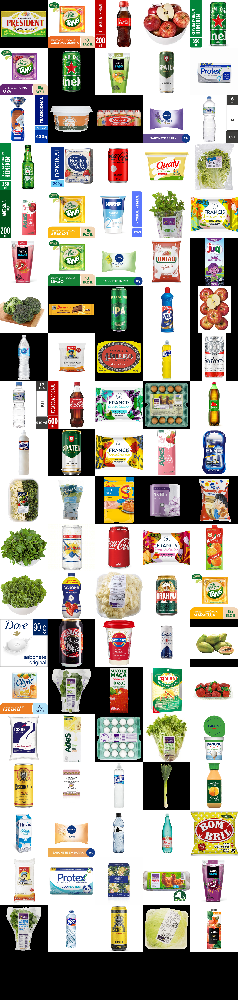

In [ ]:
mosaic(best_cart)